# List of Content
A. Import Libraries & Load Data

B. Data Preparation

C. The Baseline Model

D. Results

E. Important features

# A. Import Libraries and Data

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.under_sampling import RandomUnderSampler

from sklearn import tree
from sklearn.svm import SVC

from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, brier_score_loss, log_loss


In [2]:
# Loading Data
raw_data = pd.read_csv("mimic_iv_Final.csv")
raw_data.head()

,subject_id,gender,age,mortality,ethnicity,Heart.Rate,Heart.rate.Alarm...High,Heart.Rate.Alarm...Low,SpO2.Desat.Limit,INR,...,Comb_DS,Fibrillation,PulmonaryDisease,Stroke,Hyperlipidemia,Dementia,AvgBloodPressureSystolic,AvgBloodPressureDiastolic,ConsolidatedRespiratoryRate,AvgHemoglobin
0,10004401,M,82,Death,WHITE,104,120,60,100.0,1.7,...,0,1,0,0,0,0,158.0,129.0,33.75,10.90
1,10005348,M,76,Alive,WHITE,103,160,85,88.0,1.3,...,0,1,0,0,1,0,147.5,75.0,22.75,11.90
2,10010058,M,80,Death,ASIAN - SOUTH EAST ASIAN,155,130,50,85.0,1.5,...,0,3,0,0,1,0,119.5,88.5,29.50,13.65
3,10013049,M,52,Alive,WHITE,91,120,50,85.0,1.6,...,0,0,0,0,0,0,130.0,70.0,15.50,14.25
4,10018423,M,37,Alive,WHITE,105,120,50,85.0,1.6,...,0,0,0,0,0,0,131.5,74.0,22.25,14.50


In [3]:
raw_data['mortality'].value_counts()

mortality
Alive    2916
Death     490
Name: count, dtype: int64

In [4]:
# Convert Gender from Str to Numeric
raw_data['gender'] = pd.get_dummies(raw_data['gender'], drop_first = True)
raw_data['mortality'] = pd.get_dummies(raw_data['mortality'], drop_first = True)

In [5]:
raw_data.columns

Index(['subject_id', 'gender', 'age', 'mortality', 'ethnicity', 'Heart.Rate',
       'Heart.rate.Alarm...High', 'Heart.Rate.Alarm...Low', 'SpO2.Desat.Limit',
       'INR', 'Prothrombin.time', 'Anion.gap', 'Creatinine..serum.',
       'Bicarbonate', 'Glucose..whole.blood.', 'GCS...Eye.Opening',
       'Hematocrit', 'Platelet.Count', 'Age.Group', 'Myocardial', 'Rupture',
       'Thrombosis', 'Systolic', 'Diastolic', 'Comb_DS', 'Fibrillation',
       'PulmonaryDisease', 'Stroke', 'Hyperlipidemia', 'Dementia',
       'AvgBloodPressureSystolic', 'AvgBloodPressureDiastolic',
       'ConsolidatedRespiratoryRate', 'AvgHemoglobin'],
      dtype='object')

In [6]:
features = ['Anion.gap', 
            'Heart.Rate', 
            'Creatinine..serum.',
            'ConsolidatedRespiratoryRate',
            'age',
            'Hematocrit',
            'Bicarbonate',
            'AvgHemoglobin']

In [7]:
X = raw_data[features]
y = raw_data['mortality']

In [8]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=123)

In [9]:
# Undersampling
rus = RandomUnderSampler(random_state=42)
X_train_rus, y_train_rus= rus.fit_resample(X_train, y_train)

y_train_rus.value_counts()

mortality
False    331
True     331
Name: count, dtype: int64

In [10]:
#Undersampling the test set
X_test_rus, y_test_rus= rus.fit_resample(X_test, y_test)
y_test_rus.value_counts()

mortality
False    159
True     159
Name: count, dtype: int64

In [11]:
# Feature scaling
scaler = StandardScaler()
X_train_rus_scaled = scaler.fit_transform(X_train_rus)
X_test_rus_scaled = scaler.transform(X_test_rus)

# Checking the shape of the datasets
X_train_rus_scaled.shape, X_test_rus_scaled.shape, y_train_rus.shape, y_test_rus.shape

((662, 8), (318, 8), (662,), (318,))

In [12]:
# Checking that data is already standarized

scaled_df = pd.DataFrame(X_train_rus_scaled, columns=X_train_rus.columns)

scaled_df

,Anion.gap,Heart.Rate,Creatinine..serum.,ConsolidatedRespiratoryRate,age,Hematocrit,Bicarbonate,AvgHemoglobin
0,-0.943662,-0.755493,-0.383089,-0.847869,1.740144,-1.855733,-1.023036,-1.413743
1,-1.211890,-0.993088,-0.762680,-1.085485,-0.419280,0.871938,0.949728,1.345471
2,-0.273091,0.115687,-0.610843,-0.491444,-0.573524,0.670566,-0.233930,0.766036
3,-0.541319,0.076088,-0.496966,0.815445,1.354533,2.006941,0.555175,1.373063
4,-0.004862,1.066065,0.072420,2.270844,1.277410,0.286129,-0.628483,0.738444
...,...,...,...,...,...,...,...,...
657,-0.004862,-0.003111,1.097316,0.577829,0.737554,-0.446131,3.711596,-0.751531
658,-0.273091,0.115687,-0.383089,-0.224126,1.046044,0.963470,-0.233930,0.159009
659,-0.943662,-0.121908,-0.231252,0.459021,1.354533,-2.038798,-0.036654,-2.351875
660,-0.407205,0.274083,-0.724721,-0.164722,0.737554,-0.592583,-1.023036,-0.254873


In [13]:
# Checking class distribution in the target variable
class_distribution = y_train_rus.value_counts(normalize=True)
class_distribution

mortality
False    0.5
True     0.5
Name: proportion, dtype: float64

# C. The baseline model - SVM baseline

In [14]:
# define SVM classifier (using default parameters)
svm_classifier = SVC(random_state=123, probability=True)

# fit SVM into a data
svm_classifier.fit(X_train_rus_scaled, y_train_rus)

SVC(probability=True, random_state=123)

In [15]:
# prediction using the best decision tree model obtained from GridSearchCV
y_pred = svm_classifier.predict(X_test_rus_scaled)
y_proba_rus = svm_classifier.predict_proba(X_test_rus_scaled)[:, 1]  # predicted probabilities for class 1

# D. Results

In [16]:
# No Sampling Classification Reports
print("Classification Report: Baseline Model - Under Sampling")
print(classification_report(y_test_rus, y_pred, target_names = ['Survival', 'Death']))

Classification Report: Baseline Model - Under Sampling
              precision    recall  f1-score   support

    Survival       0.86      0.75      0.80       159
       Death       0.78      0.88      0.83       159

    accuracy                           0.81       318
   macro avg       0.82      0.81      0.81       318
weighted avg       0.82      0.81      0.81       318



In [17]:
# Calculate the false positive rate, true positive rate, and thresholds
fpr_svm, tpr_svm, thresholds_svm = roc_curve(y_test_rus, y_proba_rus)

# Calculate the AUC for SVM
auc_svm = auc(fpr_svm, tpr_svm)

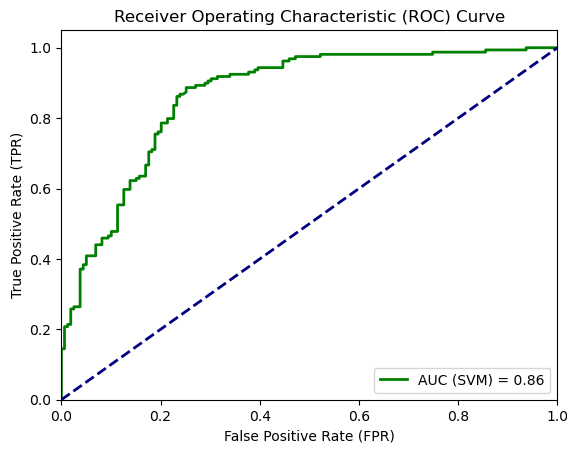

In [18]:
# Plot ROC curve for SVM
plt.plot(fpr_svm, tpr_svm, color='green', lw=2, label=f'AUC (SVM) = {auc_svm:.2f}')

# Plot the diagonal line for reference
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')

# Set plot properties
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")

plt.show()

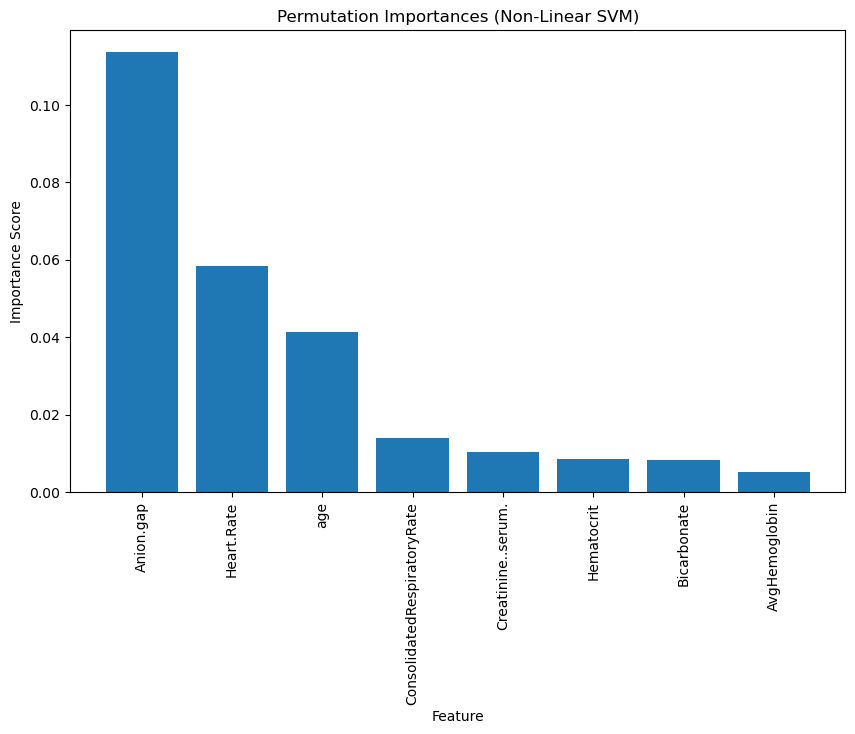

In [19]:
from sklearn.inspection import permutation_importance

# Calculate permutation importances
perm_importances = permutation_importance(svm_classifier, X_test_rus_scaled, y_test_rus, n_repeats=30, random_state=123)

# Get feature importances
feature_importances = perm_importances.importances_mean

# Create a DataFrame to associate feature names with their importances
feature_importance_df = pd.DataFrame({'Feature': X_train_rus.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance in descending order
feature_importance_df = feature_importance_df.reindex(feature_importance_df['Importance'].abs().sort_values(ascending=False).index)

# Plot the feature importances
plt.figure(figsize=(10, 6))
plt.bar(range(len(feature_importance_df)), feature_importance_df['Importance'], align='center')
plt.xticks(range(len(feature_importance_df)), feature_importance_df['Feature'], rotation='vertical')
plt.xlabel('Feature')
plt.ylabel('Importance Score')
plt.title('Permutation Importances (Non-Linear SVM)')
plt.show()

In [20]:
# Feature importance table, sort in by absolute value.
feature_importance_df

,Feature,Importance
0,Anion.gap,0.113627
1,Heart.Rate,0.058281
4,age,0.041405
3,ConsolidatedRespiratoryRate,0.013941
2,Creatinine..serum.,0.010377
5,Hematocrit,0.008386
6,Bicarbonate,0.008176
7,AvgHemoglobin,0.005136


# Confusion Matrix Analysis

## Compare mortality result vs predicted by model.

In this section an analysis of result in confusion matrix will be presented. 

1) Test data has to be select and storage in a ddr frame for comparison.
2) Add colum with real result. (_test_rus)
3) Add colum with predicted result (y_pred_rus)
4) Add a colum to identify if prediction was wrong.

In [21]:
# TEST COMPARISON

## Data set preparation for comparisson for TEST

# Next line is to unifi names of predictions between SVM and random forest
y_pred_rus = y_pred

# Next step si to continue with confusion matrix analysis

dfComparison = X_test_rus
dfComparison['y_test_rus'] = y_test_rus
dfComparison['y_pred_rus'] = y_pred_rus

# Calculate in columa FalsePosNeg if predution was wrong
# False means prediction was wrong.

dfComparison['FalsePosNeg'] = dfComparison['y_test_rus'] == dfComparison['y_pred_rus']

# Confusion Matrix

In this section confusion matrix and an analysis of errors for most important fuertures for Random forest model.
1) plot confusion matrix

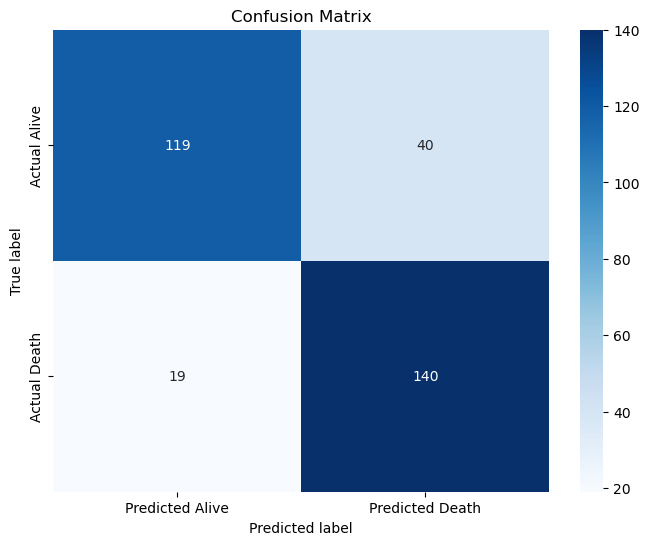

array([[119,  40],
       [ 19, 140]], dtype=int64)

In [22]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# True labels and predicted labels
true_labels = y_test_rus
predicted_labels = y_pred_rus

# Calculate confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', xticklabels=['Predicted Alive', 'Predicted Death'], yticklabels=['Actual Alive', 'Actual Death'])
plt.xlabel('Predicted label')
plt.ylabel('True label')
plt.title('Confusion Matrix')
plt.show()
cm

## References Papper to do error analysis of confusison matrix.

Ruuska, Salla, Wilhelmiina Hämäläinen, Sari Kajava, Mikaela Mughal, Pekka Matilainen, and Jaakko Mononen. 2018. 
    “Evaluation of      the Confusion Matrix Method in the Validation of an Automated System for Measuring Feeding Behaviour of Cattle.” Behavioural Processes 148 (March): 56–62. doi:10.1016/j.beproc.2018.01.004.


Link to papper:
https://www-sciencedirect-com.ezproxy.langara.ca/science/article/pii/S0376635717301146?via%3Dihub

### Main Concept
F1-score: F1-score is the harmonic mean of precision and recall. It provides a balance between precision and recall, particularly useful when dealing with imbalanced datasets. F1-score is calculated as:


Below calculatio of precision, recall, and other metris for confusion matrix analysis.

#### Definitions
TP: True Positive

FP: False Positive

TN: True Negative

FN: False Negative

Each item represent clasification of predictions in confussion matrix.

In [23]:
# Evaluation of the Confusion Matrix Method

# Check Confusion matrix values
# cm[0][0]

TP = cm[0][0]  # upper left
FP = cm[1][0]  # lower left 
TN = cm[1][1]  # lower rigth
FN = cm[0][1]  # upper rigth

# precision = TP/ (TP + FP)
precision = TP/ (TP + FP)
print('precision = TP/ (TP + FP) is '+ str(round(precision,2)))

# sensitivity/recall = TP/(TP + FN)
sensitivity = TP/(TP + FN)
print('sensitivity = TP/(TP + FN) is '+ str(round(sensitivity,2)))

# specificity = TN/(TN + FP)
specificity = TN/(TN + FP)
print('specificity = TN/(TN + FP) '+ str(round(specificity,2)))

# accuracy = (TP + TN)/(TP + TN + FP + FN).
accuracy = (TP + TN)/(TP + TN + FP + FN)
print('accuracy = (TP + TN)/(TP + TN + FP + FN). '+ str(round(accuracy,2)))

# F1-Score 
F1_Score = 2*(precision*sensitivity)/(precision+sensitivity)
print('F1-Score:'+ str(round(F1_Score,2)))



precision = TP/ (TP + FP) is 0.86
sensitivity = TP/(TP + FN) is 0.75
specificity = TN/(TN + FP) 0.88
accuracy = (TP + TN)/(TP + TN + FP + FN). 0.81
F1-Score:0.8


# Conclusion of F1 test

Model has a good balance with a *0.79* near 1 and accuracy of *80%* , these sugest balance between precision and recall is good suggests that the model is effectively predicting positive instances while minimizing false positives and false negatives.

So, they model is good to be use but from a balance point of view but predicition acurracy needs to be improve more.

In [24]:
# This step is to include a column in tst data set, the column concatenates as text real resul and predictect resul.
# This generates a category were correct and incorrecct predictions could be identify. 
dfComparison['ConfusionMatrix'] = dfComparison['y_test_rus'].astype(str)+'-'+dfComparison['y_pred_rus'].astype(str)
dfComparison


,Anion.gap,Heart.Rate,Creatinine..serum.,ConsolidatedRespiratoryRate,age,Hematocrit,Bicarbonate,AvgHemoglobin,y_test_rus,y_pred_rus,FalsePosNeg,ConfusionMatrix
2168,21,87,4.1,21.00,79,47.3,37,13.00,False,False,True,False-False
336,21,112,1.5,18.25,65,39.9,28,14.20,False,False,True,False-False
2355,12,84,1.1,30.00,84,30.0,26,9.70,False,False,True,False-False
1084,20,150,4.0,33.50,66,34.7,33,11.70,False,True,False,False-True
1473,12,98,1.0,26.50,53,42.5,27,13.70,False,False,True,False-False
...,...,...,...,...,...,...,...,...,...,...,...,...
373,18,99,1.5,26.25,89,33.3,26,9.65,True,True,True,True-True
2956,27,161,1.5,27.25,71,43.4,32,15.00,True,True,True,True-True
2825,24,119,3.0,27.00,69,32.1,29,9.40,True,True,True,True-True
2156,24,129,6.6,46.25,55,42.8,33,11.95,True,True,True,True-True


In [25]:
features_analysis = features
features_analysis.append('ConfusionMatrix')


## Explanation

In following charts false positive, false negate, true positive and true negative values are located in a cross comparison of most important features of model.

This allows to detect paters characteristics of miss classified and correctly classified observarions.

c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


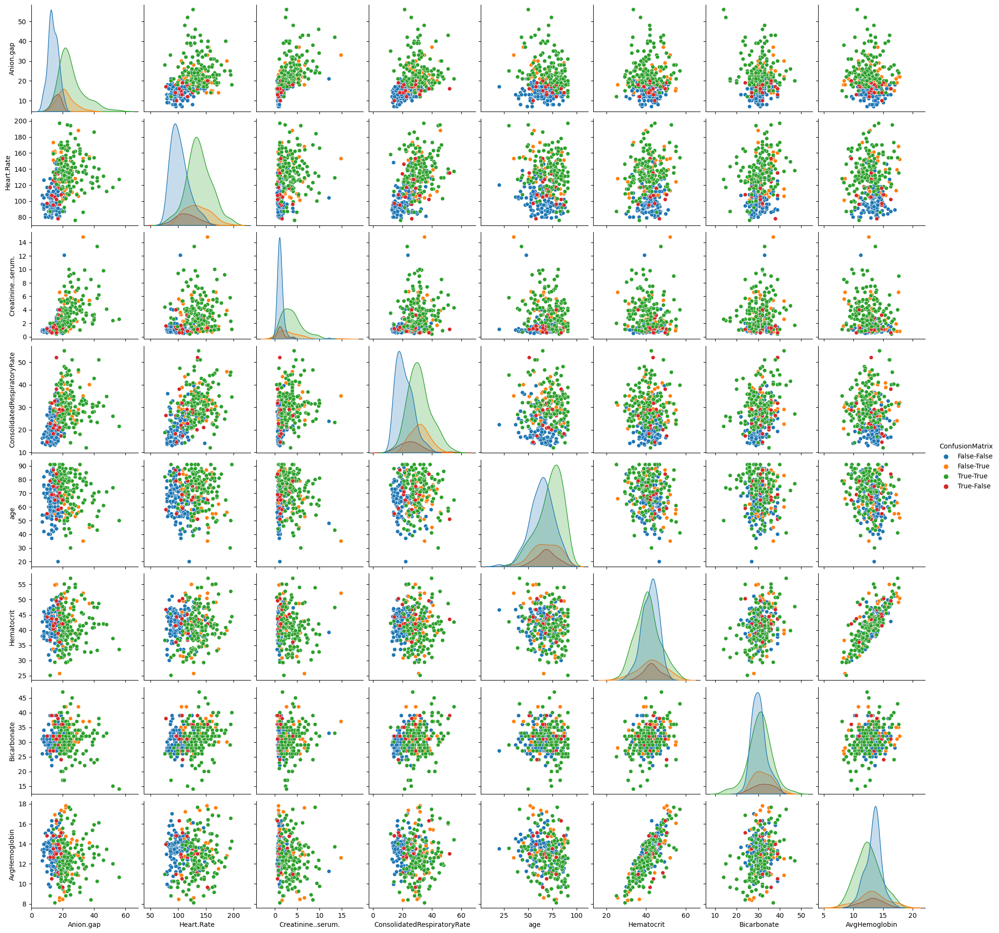

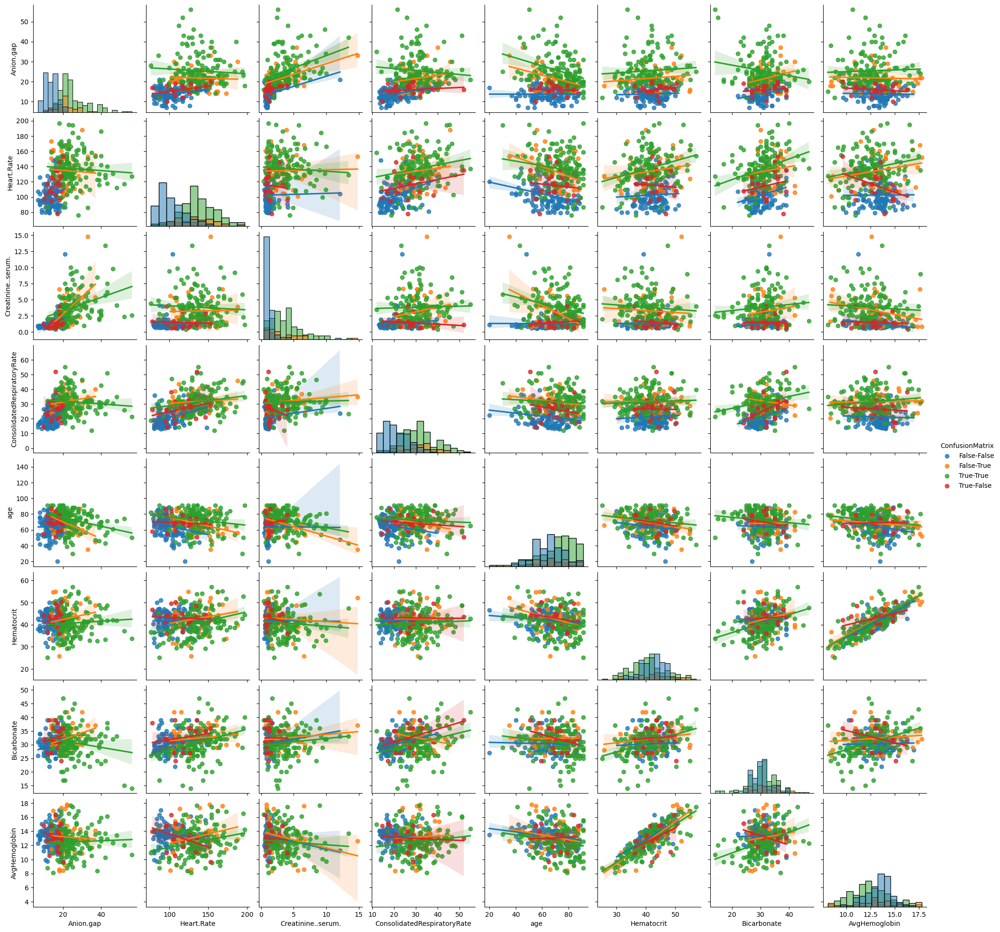

In [26]:
data = pd.DataFrame(dfComparison, columns= features_analysis)

# Create pairs plot
sns.pairplot(data, hue='ConfusionMatrix')
sns.pairplot(data, hue='ConfusionMatrix', kind='reg', diag_kind= 'hist')
# sns.pairplot(data, hue='ConfusionMatrix', kind='hist')
plt.show()


Theres is a pattern, we can see that in varaibles values are gruop, they are in a similar location and there suold be a references point that splits them.

Now, in ordet to se a comparison of missclassify and correctly classified by mortality categeogry classifications gruopus are going to bre recude, we will present True Death vs False Death. in diagonal we can see that density distribution has is differrnt and is scatted plots and theother plots a line cuold be drawn so separete correct and incorrect classified.


As well, this chart analysis is done for true alive and false alive, having same result, they could be separte with a line in chart. this means there should be a difference.

Then, in next step we will compare each varaible classsification in confusion matrix to detect differences.


c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


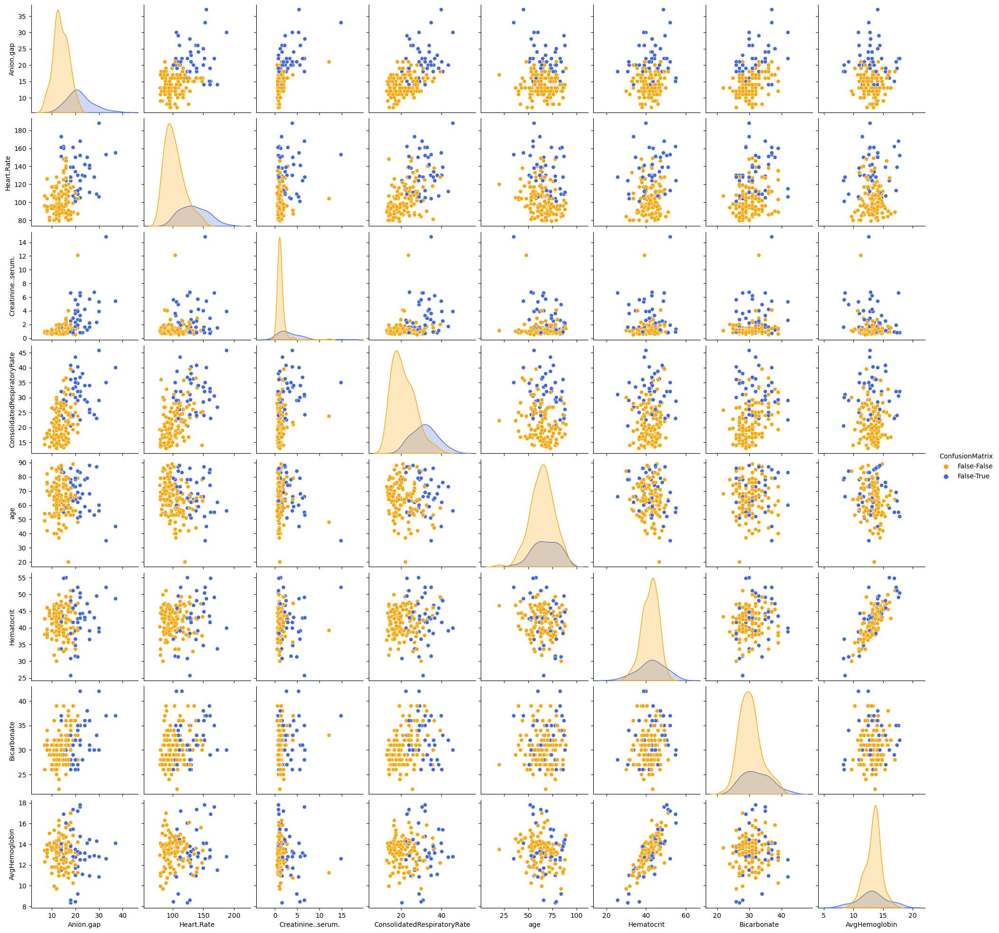

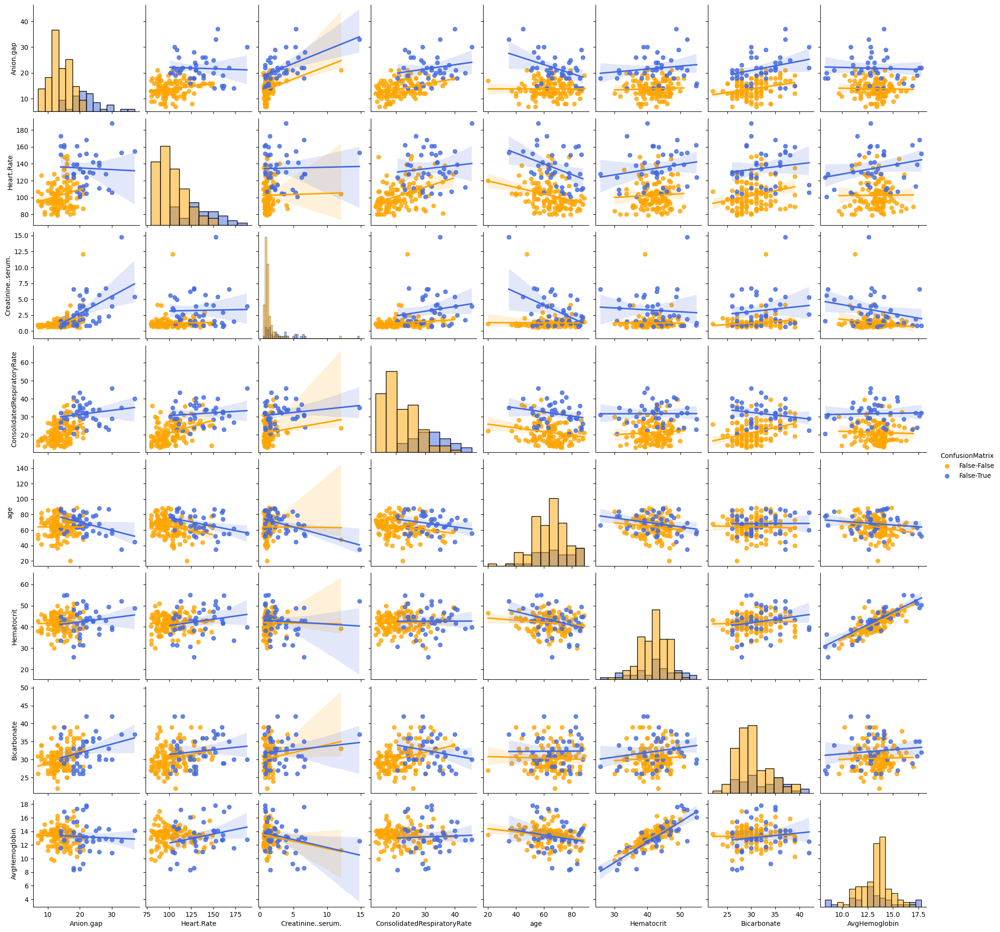

In [27]:
# ALIVE After ploting all points we need to plot just miss-classified

data_MissClassified = dfComparison[(dfComparison['y_test_rus'] == False)]

data = pd.DataFrame(data_MissClassified, columns=features_analysis)

colors = {'False-True': 'royalblue' , 'False-False': 'orange'}


# Create pairs plot
sns.pairplot(data, hue='ConfusionMatrix', palette=colors)
sns.pairplot(data, kind= 'reg', hue='ConfusionMatrix', diag_kind='hist', palette=colors)
# sns.pairplot(data, kind= 'hist', hue='ConfusionMatrix')
plt.show()


c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
c:\Users\mario\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


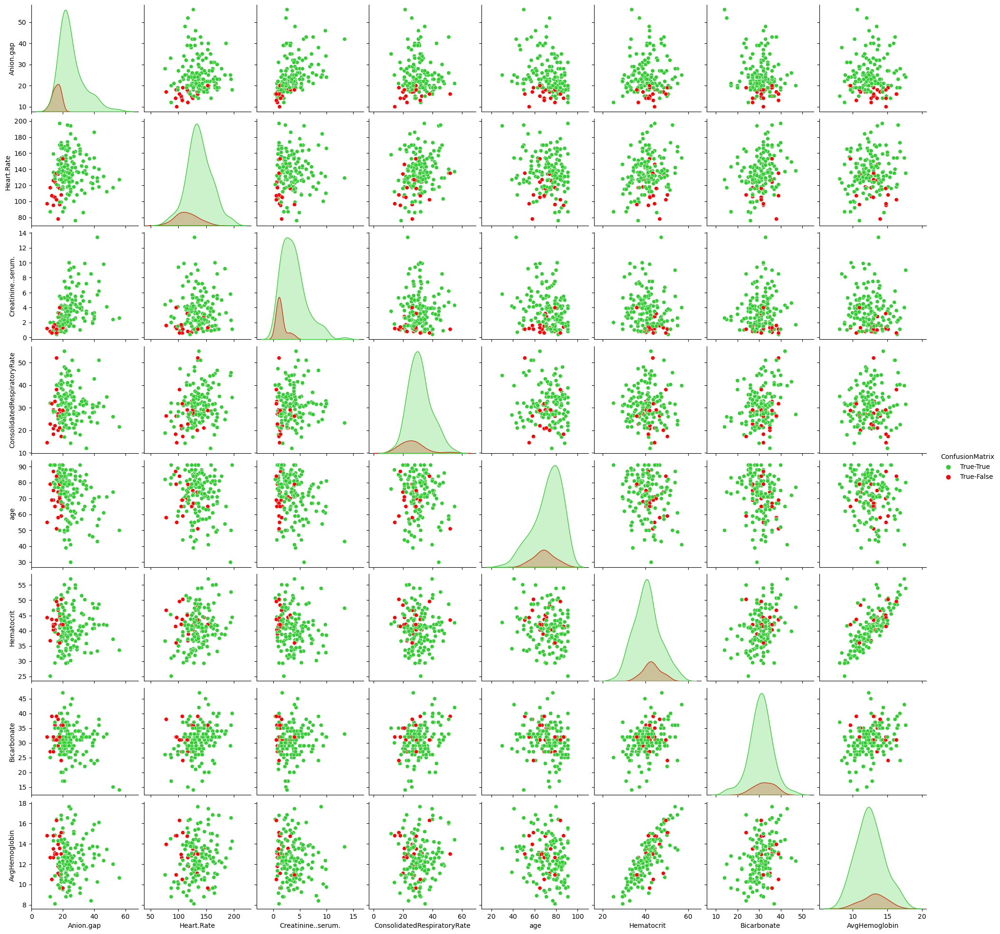

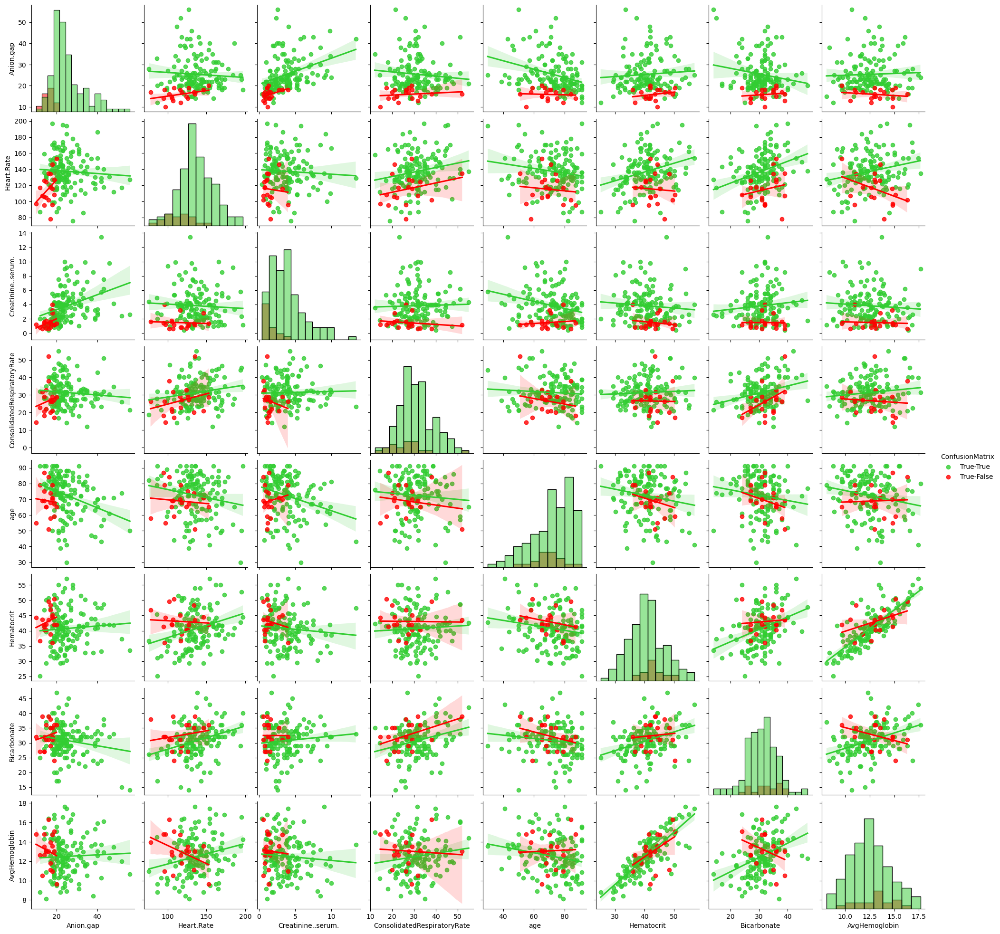

In [28]:
# DEATH After ploting all points we need to plot just miss-classified

data_MissClassified = dfComparison[(dfComparison['y_test_rus'] == True)]

data = pd.DataFrame(data_MissClassified, columns=features_analysis)

colors = {'True-True': 'limegreen', 'True-False': 'red'}

# Create pairs plot
sns.pairplot(data, hue='ConfusionMatrix', palette=colors)
sns.pairplot(data, kind= 'reg', hue='ConfusionMatrix', diag_kind='hist',palette=colors)
# sns.pairplot(data, kind= 'hist', hue='ConfusionMatrix')
plt.show()

# Detect diffenrences by feature (Boxplots)

To detect differences of each feature depending of its clasification con  confusion matrix boxplot chart is the visual tool to do it.

As can be seen below flase positives (False-True) and true-negatives (False-False), boxplots not overlaping and with a consistent patter over most important feautures. As well, for true positives (True-True) and true negatives (True-False) show same behavior.

The explanation of missclassification for test set for most important feaure depen on value of varaible by its on and as well is related with most important varibles of prediction for the model.

In [29]:
features_boxplot = features_analysis

features_boxplot.remove('ConfusionMatrix')

Anion.gap


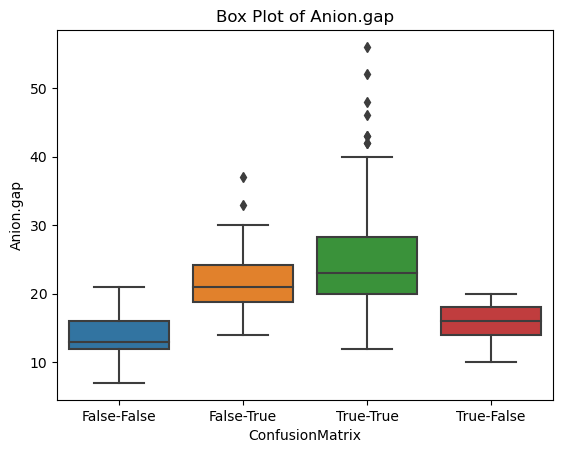

Heart.Rate


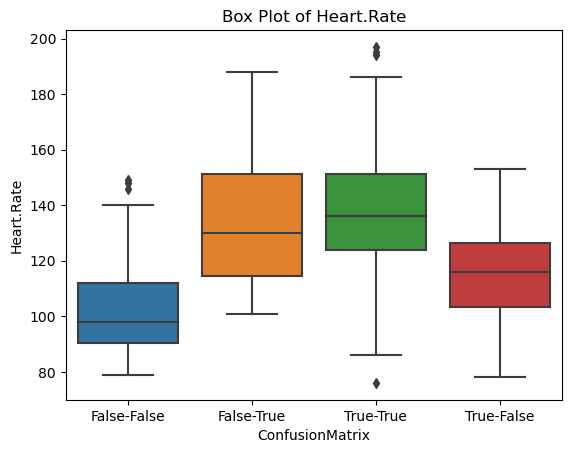

Creatinine..serum.


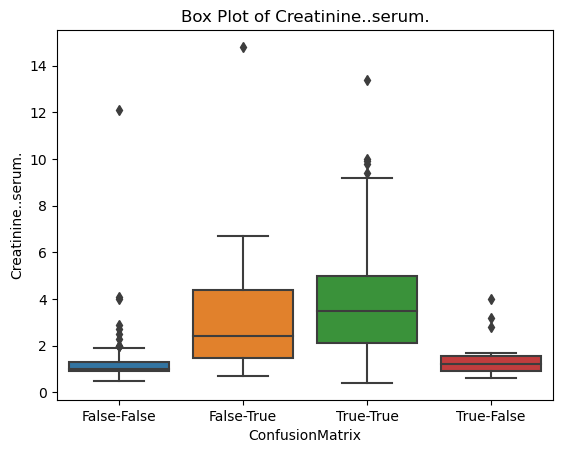

ConsolidatedRespiratoryRate


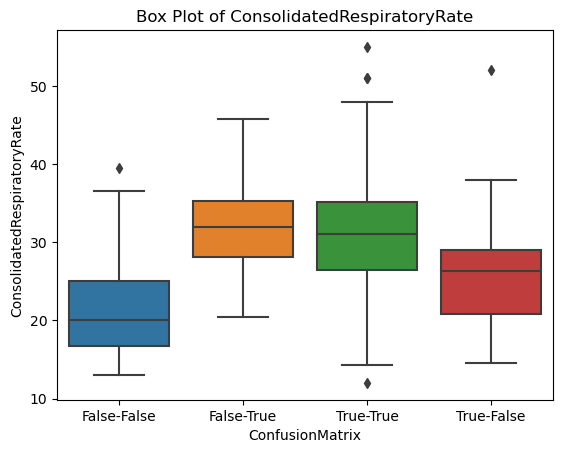

age


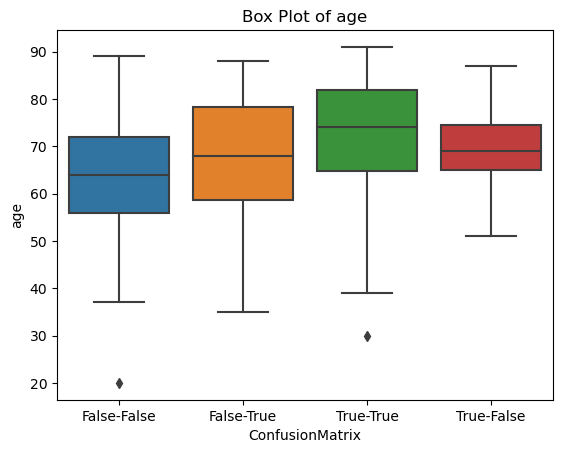

Hematocrit


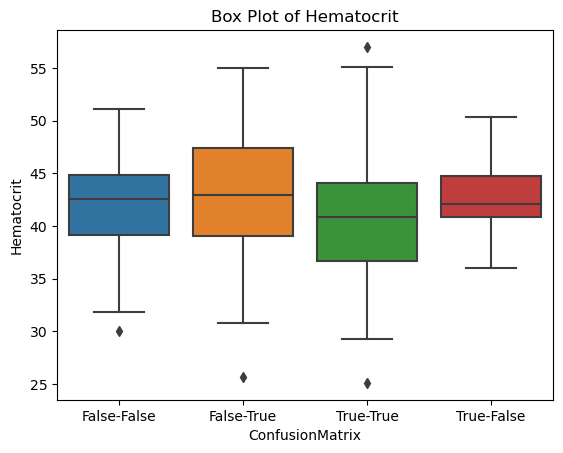

Bicarbonate


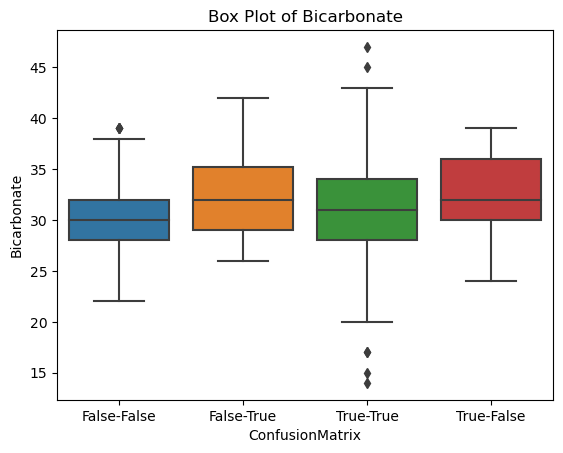

AvgHemoglobin


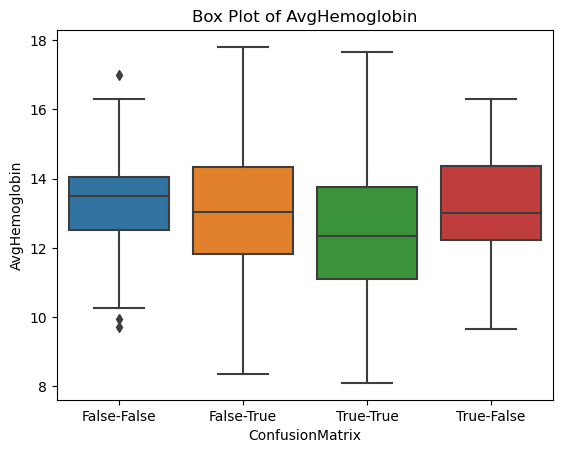

In [30]:

for feature in features_boxplot:
    # Create a figure with 3 subplots
    print(feature)
    sns.boxplot(x='ConfusionMatrix', y=str(feature), data=dfComparison)
    plt.title('Box Plot of '+str(feature))
    plt.xlabel('ConfusionMatrix')
    plt.ylabel(str(feature))
    # plt.grid(True)
    plt.show()

    # sns.scatterplot(data=dfComparison, x='subject_id', y=feature, hue='ConfusionMatrix', palette="deep")
    # plt.title('Scattet of '+str(feature))
    # plt.xlabel('Index')
    # plt.ylabel(str(feature))
    # plt.show()
